# Data Enhancement
Edge Enhancement and Gaussian Blur

In [1]:
import os
import cv2
import glob
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

from torchvision.datasets import OxfordIIITPet

from tqdm import tqdm 

## Load test image data

In [2]:
path = './Data/*.jpg'

image_path = sorted(glob.glob(path))
print(image_path)

['./Data/shiba-inu-01.jpg', './Data/shiba-inu-02.jpg', './Data/shiba-inu-03.jpg']


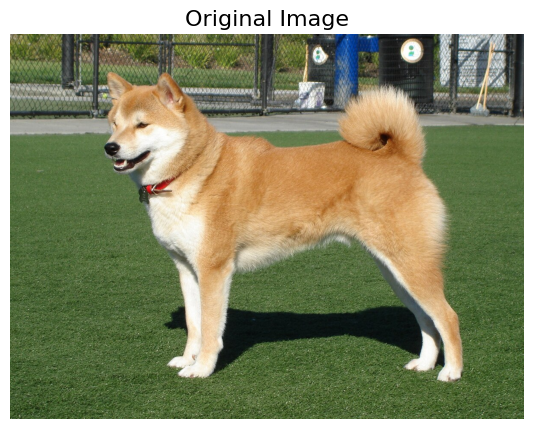

In [3]:
image = cv2.imread(image_path[2], cv2.IMREAD_UNCHANGED)

plt.figure(figsize=(16, 5))
plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image', fontsize=16)
plt.axis('off')
plt.tight_layout()
plt.show()

## Edge detect

```       
Strength (image brightness changes) of pixels:

    False    ｜    Maybe    ｜    True    
           minVal         maxVal         

Value between threshold: 
    Weak Edge connected to at least one Strong Edge => Strong Edge
```

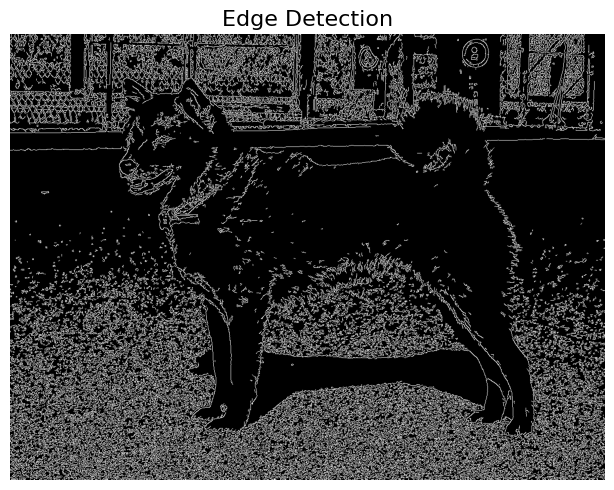

In [4]:
# Remove the Alpha channel (transparency)
if image.shape[2] == 4:
    image = cv2.cvtColor(image, cv2.COLOR_BGRA2BGR)

# Apply Canny edge detection
edges = cv2.Canny(image, 100, 200)

plt.figure(figsize=(16, 5))
plt.imshow(edges, cmap=plt.cm.gray)
plt.title('Edge Detection', fontsize=16)
plt.axis('off')
plt.tight_layout()
plt.show()


### `ISSUE`: Some close background (e.g. grass) can be detected as well.

`SOLUTION` => Apply Gaussian Blur to avoid false detact

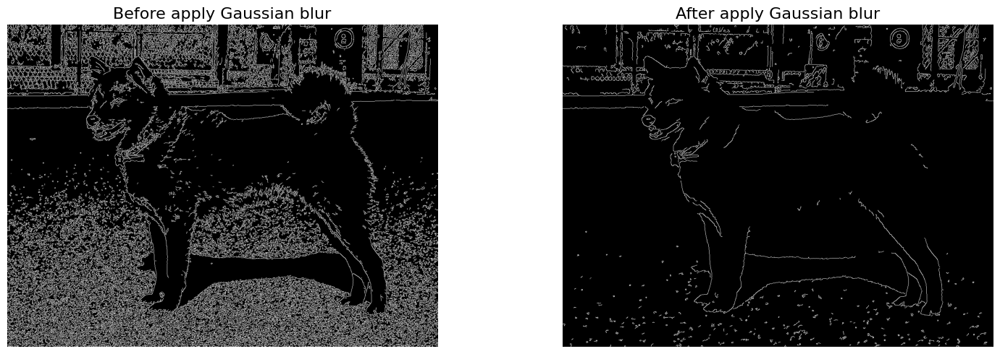

In [5]:
# Apply Gaussian Blur （avoid false detact）
image_blurred = cv2.GaussianBlur(image, (5, 5), 0)

# Apply Canny edge detection
edges_blurred = cv2.Canny(image_blurred, 100, 200)

plt.figure(figsize=(16, 5))

plt.subplot(1, 2, 1)
plt.imshow(edges, cmap=plt.cm.gray)
plt.title('Before apply Gaussian blur', fontsize=16)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(edges_blurred, cmap=plt.cm.gray)
plt.title('After apply Gaussian blur', fontsize=16)
plt.axis('off')

plt.tight_layout()
plt.show()

### Overlay the detected edges onto the original image

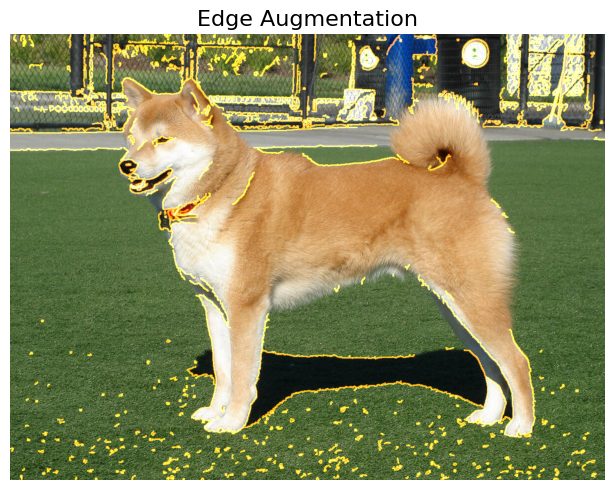

In [6]:
# Edge expansion
kernel = np.ones((3,3), np.uint8)

# Thicken edge lines
edges_dilated = cv2.dilate(edges_blurred, kernel, iterations=1)

# Highlight edges
edges_colored_dilated = np.zeros_like(image)
edges_colored_dilated[edges_dilated > 0] = [0, 128, 255]

# Edges -> Original img
image_with_thick_edges = cv2.addWeighted(image, 1, edges_colored_dilated, 1, 0)

plt.figure(figsize=(16, 5))
plt.imshow(cv2.cvtColor(image_with_thick_edges, cv2.COLOR_BGR2RGB))
plt.title('Edge Augmentation', fontsize=16)
plt.axis('off')
plt.tight_layout()
plt.show()


### Construct into pipeline

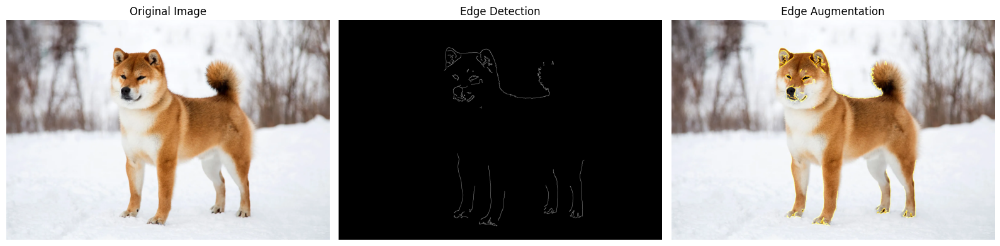

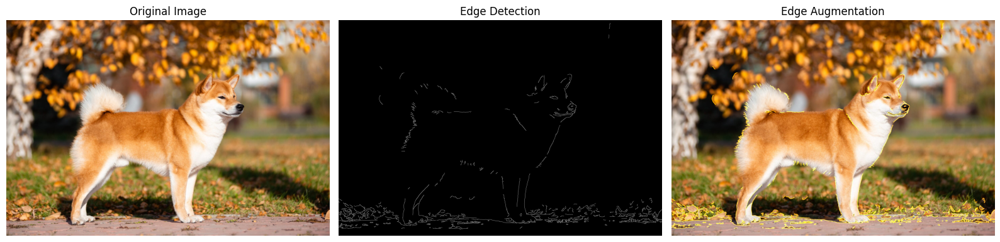

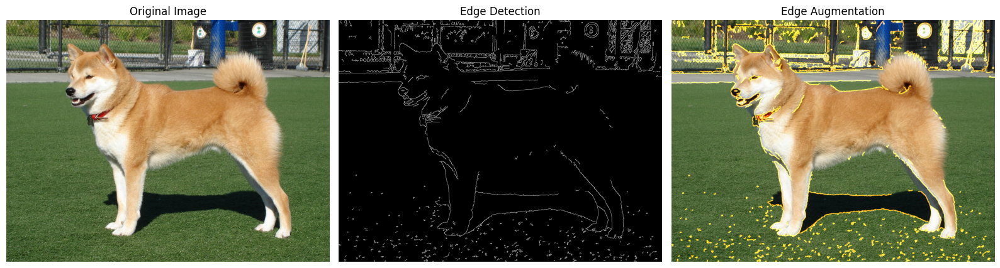

In [7]:
for i in range(3):
    image = cv2.imread(image_path[i], cv2.IMREAD_UNCHANGED)

    # Remove the Alpha channel (transparency)
    if image.shape[2] == 4:
        image = cv2.cvtColor(image, cv2.COLOR_BGRA2BGR)

    # Apply Gaussian Blur （avoid false detact）
    blurred_image = cv2.GaussianBlur(image, (5, 5), 0)

    # Apply Canny edge detection
    edges = cv2.Canny(blurred_image, 100, 200)

    '''
        Thicken edge lines
    '''
    # Edge expansion
    kernel = np.ones((3,3), np.uint8)
    edges_dilated = cv2.dilate(edges, kernel, iterations=1)

    # Highlight edges
    edges_colored_dilated = np.zeros_like(image)
    edges_colored_dilated[edges_dilated > 0] = [0, 128, 255] # [0, 128, 255]
    # edges_colored_dilated[edges > 0] = [0, 128, 255]

    # Edges -> Original img
    image_with_thick_edges = cv2.addWeighted(image, 1, edges_colored_dilated, 1, 0)

    plt.figure(figsize=(16, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(edges, cmap=plt.cm.gray)
    plt.title('Edge Detection')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(image_with_thick_edges, cv2.COLOR_BGR2RGB))
    plt.title('Edge Augmentation')
    plt.axis('off')

    plt.tight_layout()
    plt.savefig('./Data/edge_enhanced_test.png', dpi=300)
    plt.show()

    # cv2.imwrite(f'./Figures/{file_name}_enhanced.png', image_with_thick_edges)

### Without thicken edge lines
Preserve more image details and avoid occlusion.

In [8]:
def img_edge_enhance(image, file_name, disp=False, color_RGB=[255, 255, 255]):

    # Apply Gaussian Blur （avoid false detact）
    blurred_image = cv2.GaussianBlur(image, (5, 5), 0)

    # Apply Canny edge detection
    edges = cv2.Canny(blurred_image, 100, 200)

    '''
        Thicken edge lines
    '''
    # # Edge expansion
    # kernel = np.ones((3,3), np.uint8)
    # edges_dilated = cv2.dilate(edges, kernel, iterations=1)

    # Highlight edges
    edges_colored_dilated = np.zeros_like(image)
    # edges_colored_dilated[edges_dilated > 0] = color_RGB # [0, 128, 255]
    edges_colored_dilated[edges > 0] = color_RGB
       
    # Edges -> Original img
    image_with_thick_edges = cv2.addWeighted(image, 1, edges_colored_dilated, 1, 0)

    if disp == True:
        plt.figure(figsize=(16, 5))

        plt.subplot(1, 5, 1)
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title('Original Image')
        plt.axis('off')

        plt.subplot(1, 5, 2)
        plt.imshow(edges, cmap=plt.cm.gray)
        plt.title('Edge Detection')
        plt.axis('off')

        plt.subplot(1, 5, 3)
        plt.imshow(cv2.cvtColor(image_with_thick_edges, cv2.COLOR_BGR2RGB))
        plt.title('Edge Augmentation')
        plt.axis('off')

        plt.subplot(1, 5, 4)
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2GRAY))
        plt.title('Original Grey Image')
        plt.axis('off')

        plt.subplot(1, 5, 5)
        plt.imshow(cv2.cvtColor(image_with_thick_edges, cv2.COLOR_BGR2GRAY))
        plt.title('Edge Enhanced Grey Image')
        plt.axis('off')

        plt.tight_layout()
        # plt.savefig('./Figures/edge_enhanced.png', dpi=300)
        plt.show()

    cv2.imwrite(f'./Figures/{file_name}_enhanced.png', image_with_thick_edges)

## Apply to Oxford-IIIT Pet Dataset

In [9]:
data_category = OxfordIIITPet('./Data/oxPet', download=True)
length = len(data_category)
print("Number of datapoints:", length)
classes = data_category.classes
print("Number of classes:\t   ", len(classes))

Number of datapoints: 3680
Number of classes:	    37


In [10]:
path = './Data/oxPet/oxford-iiit-pet/images/*.jpg'

image_path = sorted(glob.glob(path))
print(f"Total: {len(image_path)}, e.g. {image_path[:2]}")

file_names = [os.path.splitext(os.path.basename(file))[0] for file in image_path]

Total: 7390, e.g. ['./Data/oxPet/oxford-iiit-pet/images/Abyssinian_1.jpg', './Data/oxPet/oxford-iiit-pet/images/Abyssinian_10.jpg']


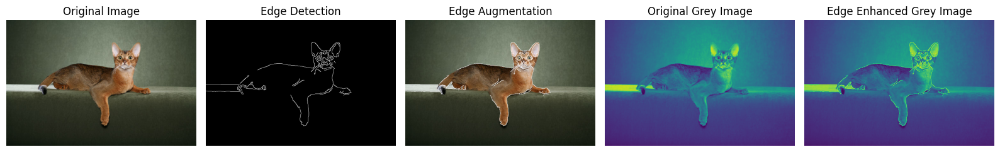

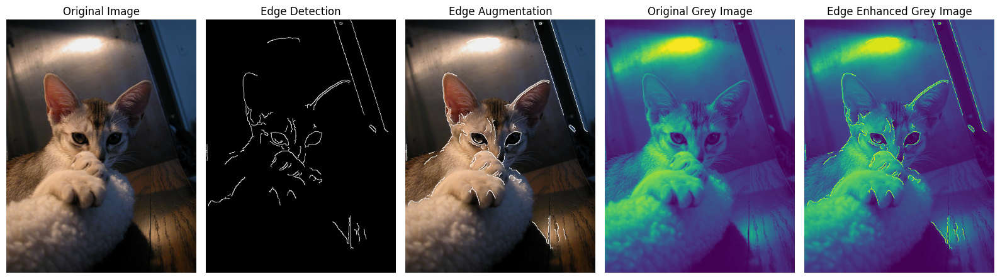

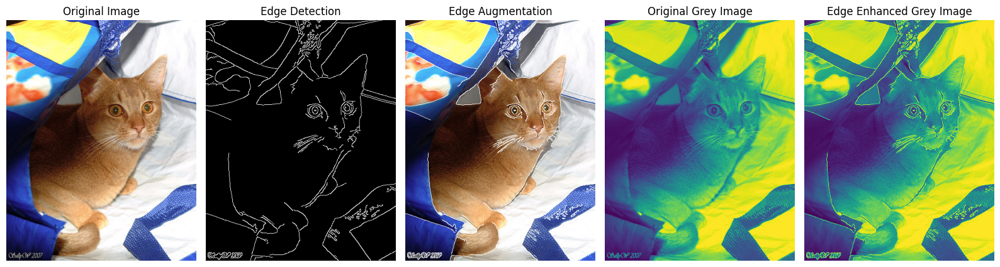

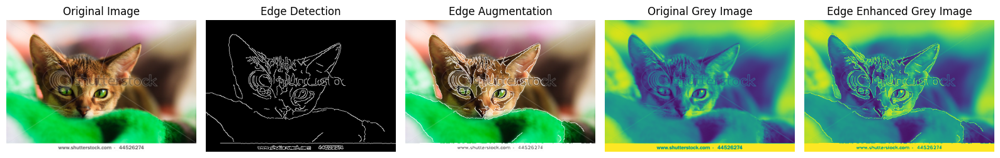

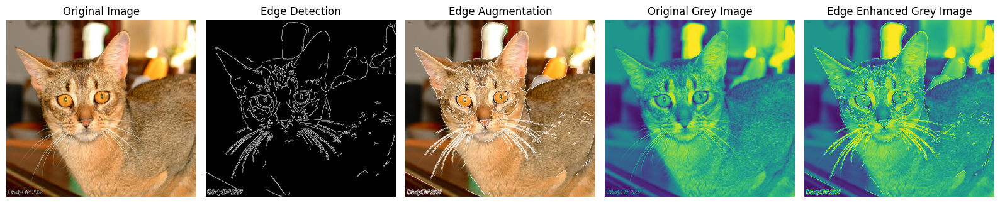

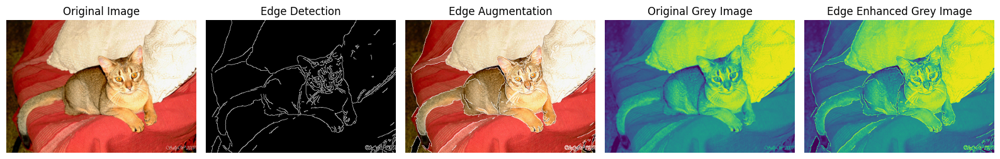

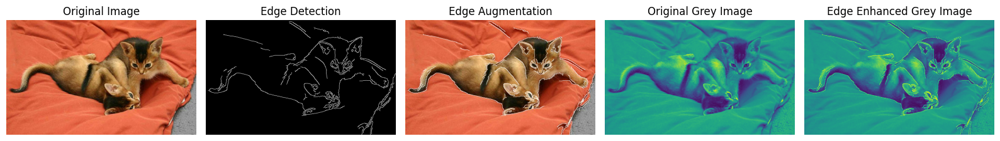

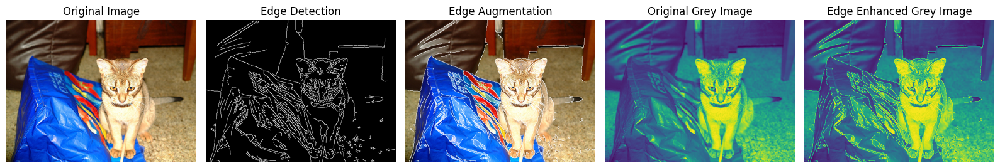

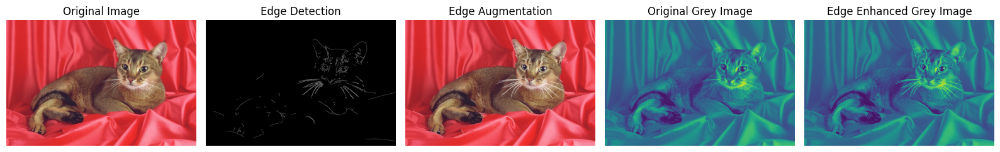

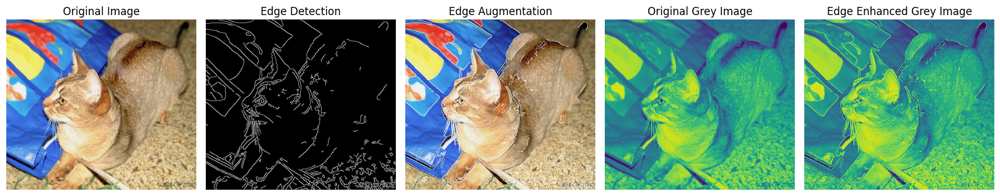

In [ ]:
for i in range(10):
    image = cv2.imread(image_path[i], cv2.IMREAD_UNCHANGED)
    img_edge_enhance(image, file_names[i], disp=True, color_RGB=[225,225,225]) # [225,225,225]; [0, 255, 128]

**Apply to all**

In [ ]:
for i in tqdm(range(len(image_path))):
    
    pil_image = Image.open(image_path[i])

    '''
        Handle some special images
    '''
    # Ensure image is RGB mode
    if pil_image.mode != 'RGB':
        pil_image = pil_image.convert('RGB')

    # PIL => NumPy
    open_cv_image = np.array(pil_image)

    # RGB => BGR for openCV
    open_cv_image = open_cv_image[:, :, ::-1]

    # Remove the Alpha channel (transparency)
    if open_cv_image.ndim == 3 and open_cv_image.shape[2] == 4:
        # Remove Alpha if image is BGRA
        open_cv_image = cv2.cvtColor(open_cv_image, cv2.COLOR_BGRA2BGR)
    elif open_cv_image.ndim == 3 and open_cv_image.shape[2] == 3:
        # No need for BGR image
        pass
    elif open_cv_image.ndim == 2:
        # No need for grey image
        pass

    img_edge_enhance(open_cv_image, file_names[i], disp=False)

  0%|          | 0/7390 [00:00<?, ?it/s]

100%|██████████| 7390/7390 [01:15<00:00, 97.76it/s] 


## Pytorch V2 transforms

In [1]:
import numpy as np
from random import randint

import cv2

from pathlib import Path
from PIL import Image

import torch
from torchvision import transforms as T
from torchvision.transforms import v2

from torch.utils.data import DataLoader, Dataset
from torchvision.datasets import OxfordIIITPet

In [2]:
class CannyEdgeDetection:
    def __init__(self, low_threshold, high_threshold):
        self.low_threshold = low_threshold
        self.high_threshold = high_threshold

    def __call__(self, img):
        # Tensor -> cv2 (numpy)
        if isinstance(img, torch.Tensor):
            img = img.mul(255).byte()
            img = img.cpu().numpy()
            if img.ndim == 3:
                img = img.transpose(1, 2, 0)
            # PyTorch->RGB, OpenCV->BGR
            img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)  
        elif isinstance(img, Image.Image):
            img = np.array(img)

        img_blur = cv2.GaussianBlur(img, (9, 9), 0)
        
        # img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        edges = cv2.Canny(img_blur, self.low_threshold, self.high_threshold)

        # Highlight edges
        edges_colored_dilated = np.zeros_like(img)
        edges_colored_dilated[edges > 0] = 255
        
        # Edges -> Original img
        image_with_edges = cv2.addWeighted(img, 1, edges_colored_dilated, 1, 0)
        
        # cv2 -> PIL
        edges_img = Image.fromarray(image_with_edges)

        return edges_img

transforms = v2.Compose([
    CannyEdgeDetection(low_threshold=100, high_threshold=200),
    v2.Resize((256, 256)),
    v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)]),
])

def pil_plot(image):
    # Tensor -> PIL
    if isinstance(image, torch.Tensor):
        pil_image = v2.ToPILImage()(image)
    elif isinstance(image, Image.Image):
        pil_image = image
    
    pil_image.show()



In [3]:
class OxfordPetDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = Path(root_dir)
        self.transform = transform
        self.images = list(self.root_dir.glob('*.jpg'))

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = self.images[idx]

        # print(img_path)

        image = Image.open(img_path)

        image_enhanced = self.transform(image)
        
        # return image, image_enhanced
        return image_enhanced

In [5]:
root_dir = "./Data/oxPet/oxford-iiit-pet/images"

transformed_dataset = OxfordIIITPet('./Data/oxPet', download=True)

# transformed_dataset = OxfordPetDataset(root_dir=root_dir, transform=transforms)

data_loader = DataLoader(transformed_dataset, batch_size=4, shuffle=True)

length = len(data_loader)
print("Number of datapoints:", length)

Number of datapoints: 920


In [6]:
tensor_image = transformed_dataset[randint(0, length - 1)]

pil_plot(tensor_image)

UnboundLocalError: cannot access local variable 'pil_image' where it is not associated with a value

In [36]:
i = 0
for batch in data_loader:
    images = batch
    for img in images:
        tensor_image = transforms(img)
        pil_plot(tensor_image)
        i += 1
        if i > 2:
            break
    if i > 2:
        break
